In [1]:
suppressPackageStartupMessages({
  library(Seurat)
  library(dplyr)
  library(ggplot2)
  library(scCustomize)
  library(scater)
    library(RColorBrewer)
    library(data.table)
    library(stringr)
library(tibble)
    library(tidyr)
})

In [2]:
sessionInfo()

R version 4.3.2 (2023-10-31)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Red Hat Enterprise Linux 8.10 (Ootpa)

Matrix products: default
BLAS/LAPACK: /scratch/gpfs/KANG/hirak/mambaforge/envs/r43/lib/libopenblasp-r0.3.23.so;  LAPACK version 3.11.0

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

time zone: America/New_York
tzcode source: system (glibc)

attached base packages:
[1] stats4    stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] tidyr_1.3.1                 tibble_3.2.1               
 [3] stringr_1.5.1               data.table_1.15.2          
 [5] RColorBrewer_1.1-3          scater_1.28.0           

In [3]:
fig.size <- function (height, width, res=300) {
    options(repr.plot.height = height, repr.plot.width = width, resolution=res)
}

In [6]:
adr.obj = readRDS(glue::glue(
            '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis',
            '/results/seurat_2/heatmap_objects/mouse_obj.rds'
        )
)

In [8]:
adr.obj@meta.data %>% pull(orig.ident) %>% unique

[1] "het1"  "het2"  "homo1" "homo2" "homo3"

In [9]:
bm.obj = readRDS(glue::glue(
            '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis',
            '/results/seurat_2/5_sample_bone_marrow/5_bone_marrow.rds'
        )
)

In [10]:
bm.obj@meta.data %>% pull(orig.ident) %>% unique

[1] "het1_bm"  "het2_bm"  "homo1_bm" "homo2_bm" "homo3_bm"

In [14]:
org.obj = readRDS(
    glue::glue(
            '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis',
            '/results/seurat_2/organoid/combined_new_6_samples_annotated.rds'
        )
)

In [15]:
org.obj@meta.data %>% pull(orig.ident) %>% unique

[1] "no_6_PT"  "no_6_5"   "no_6_0"   "no_50_0"  "no_50_5"  "no_50_PT"

In [16]:
adr.list =  SplitObject(adr.obj, split.by = "orig.ident")

In [17]:
org.list = SplitObject(org.obj, split.by = "orig.ident")

In [18]:
homo.list = c(
    adr.list$homo1,
    adr.list$homo2,
    adr.list$homo3,
    org.list$no_6_PT,
    org.list$no_50_PT
)

In [107]:
homo.list <- lapply(X = homo.list, FUN = function(x) {
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 5000)
})


In [108]:
features <- SelectIntegrationFeatures(object.list = homo.list)
homo.list <- lapply(X = homo.list, FUN = function(x) {
    x <- ScaleData(x, features = features, verbose = FALSE)
    x <- RunPCA(x, features = features, verbose = FALSE)
})

In [109]:
immune.anchors <- FindIntegrationAnchors(
    object.list = homo.list, 
    anchor.features = features, 
    reduction = "rpca"
)

Scaling features for provided objects

Computing within dataset neighborhoods

Finding all pairwise anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 4521 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 5712 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 4904 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 4688 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 3602 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 5822 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 5056 anchors

Projecting new data onto SVD

Projecting new

In [110]:
immune.combined <- IntegrateData(anchorset = immune.anchors)

Merging dataset 2 into 3

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 1 into 3 2

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 5 into 3 2 1

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 4 into 3 2 1 5

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Warning message:
“Different cells and/or features from existing assay integrated”


In [111]:
DefaultAssay(immune.combined) <- "integrated"

# Run the standard workflow for visualization and clustering
immune.combined <- ScaleData(immune.combined, verbose = FALSE)
immune.combined <- RunPCA(immune.combined, npcs = 30, verbose = FALSE)
immune.combined <- RunUMAP(immune.combined, reduction = "pca", dims = 1:30)
immune.combined <- FindNeighbors(immune.combined, reduction = "pca", dims = 1:30)
immune.combined <- FindClusters(immune.combined, resolution = 0.5)

14:25:37 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

14:25:37 Read 41430 rows and found 30 numeric columns

14:25:37 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

14:25:37 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:25:40 Writing NN index file to temp file /tmp/RtmpofxGb5/file1928a31b4df4b

14:25:40 Searching Annoy index using 1 thread, search_k = 3000

14:25:51 Annoy recall = 100%

14:25:52 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

14:25:54 Initializing from normalized Laplacian +

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 41430
Number of edges: 1419505

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8924
Number of communities: 21
Elapsed time: 10 seconds


1 singletons identified. 20 final clusters.



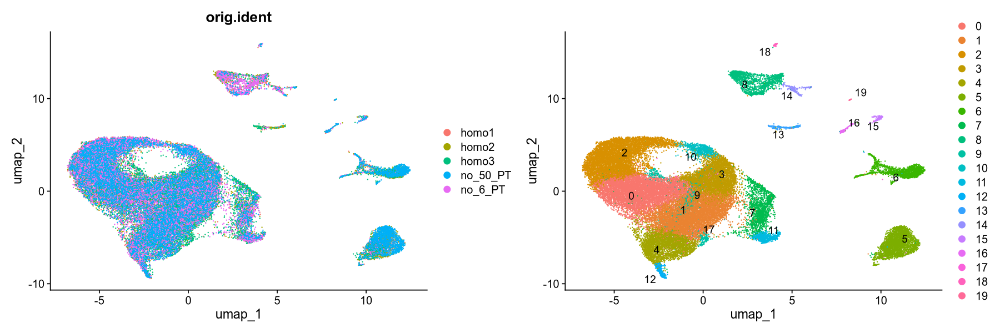

In [112]:
fig.size(5,15)
p1 <- DimPlot(immune.combined, reduction = "umap", group.by = "orig.ident")
p2 <- DimPlot(immune.combined, reduction = "umap", label = TRUE,
    repel = TRUE)
p1 + p2

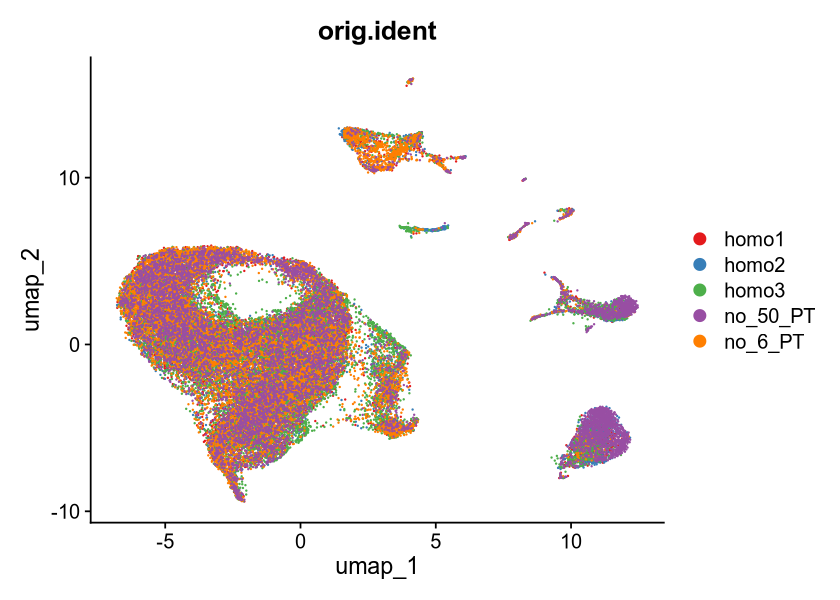

In [113]:
palette_name <- "Set1"
num_colors <- 5

# Check the available colors in the palette
colors <- brewer.pal(num_colors, palette_name)
fig.size(5,7)
# Plot with the selected palette
DimPlot(immune.combined, reduction = "umap", group.by = "orig.ident") +
  scale_color_manual(values = colors)

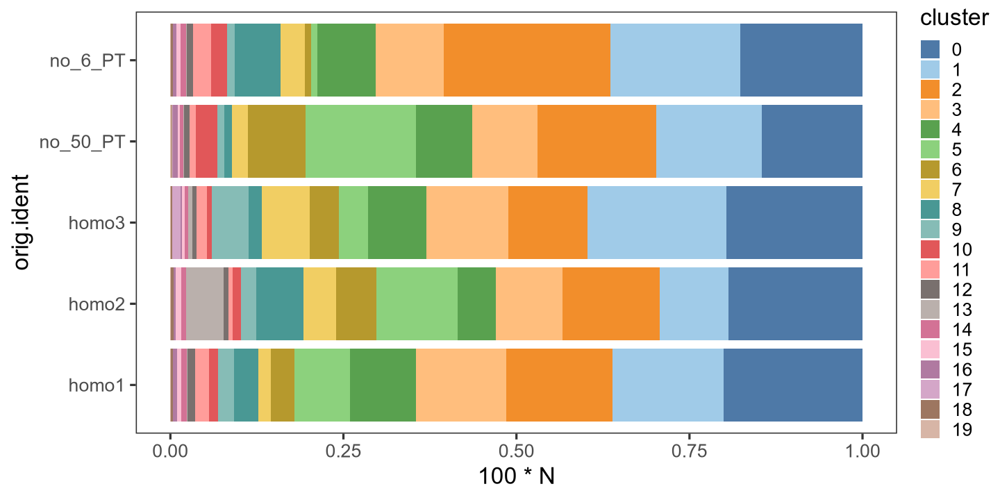

In [114]:
fig.size(6,12)
immune.combined@meta.data %>%
    with(prop.table(table( orig.ident, seurat_clusters ), 1)) %>%
    data.table() %>%
    mutate(cluster = factor(seurat_clusters, (0:19))) %>%
    ggplot(aes(orig.ident, 100*N, fill = cluster)) +
    geom_bar(stat = 'identity', position = position_fill()) +
    ggthemes::scale_fill_tableau('Tableau 20') +
    coord_flip() +
    theme_test(base_size = 20)

In [115]:
annotations.df = openxlsx::read.xlsx(
    '../Figure5_20230830_No_6-50_Organoids_seurat_annotation_1.xlsx')

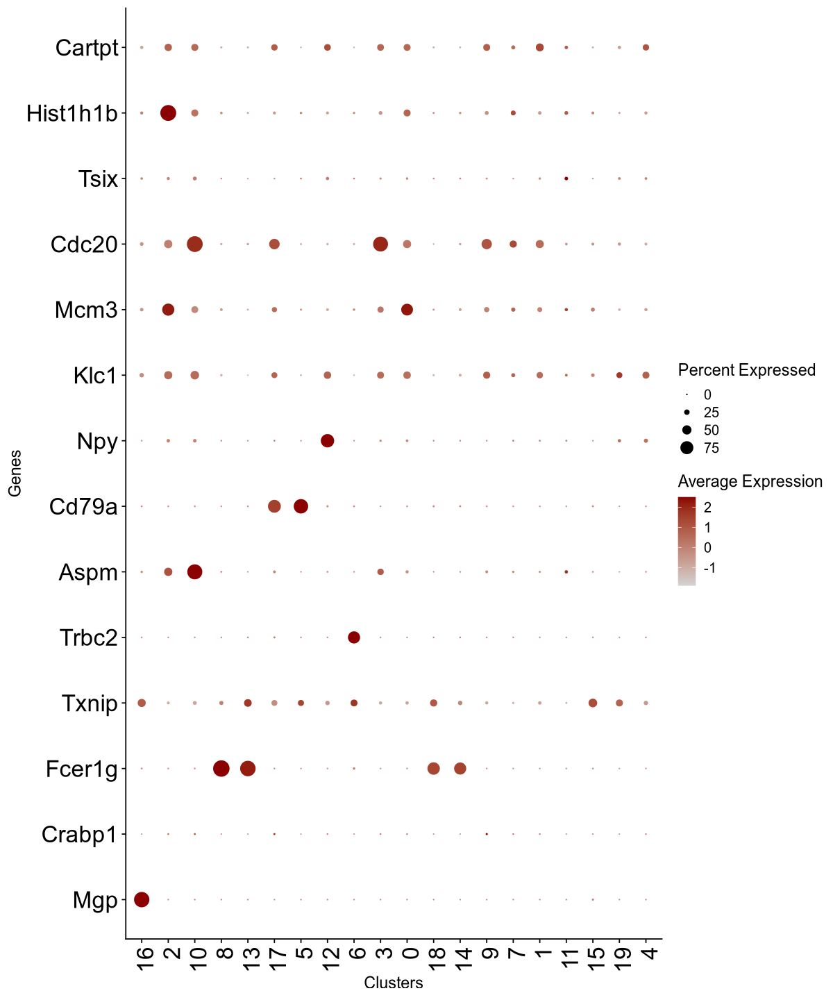

In [125]:
options(repr.plot.height=12, repr.plot.width=10, res=200)
pdot = DotPlot(
        immune.combined, 
        assay='RNA',
        features = unique(annotations.df$Gene) %>% stringr::str_to_title() %>% rev,  
        cols = c("lightgrey", "darkred"))+
         coord_flip()+theme(
        axis.text.x = element_text(size=20,angle = 90, hjust = 1,vjust = 0.7),
        axis.text.y = element_text(size=20)
       ) +
        xlab('Genes')+
        ylab('Clusters')
pdot

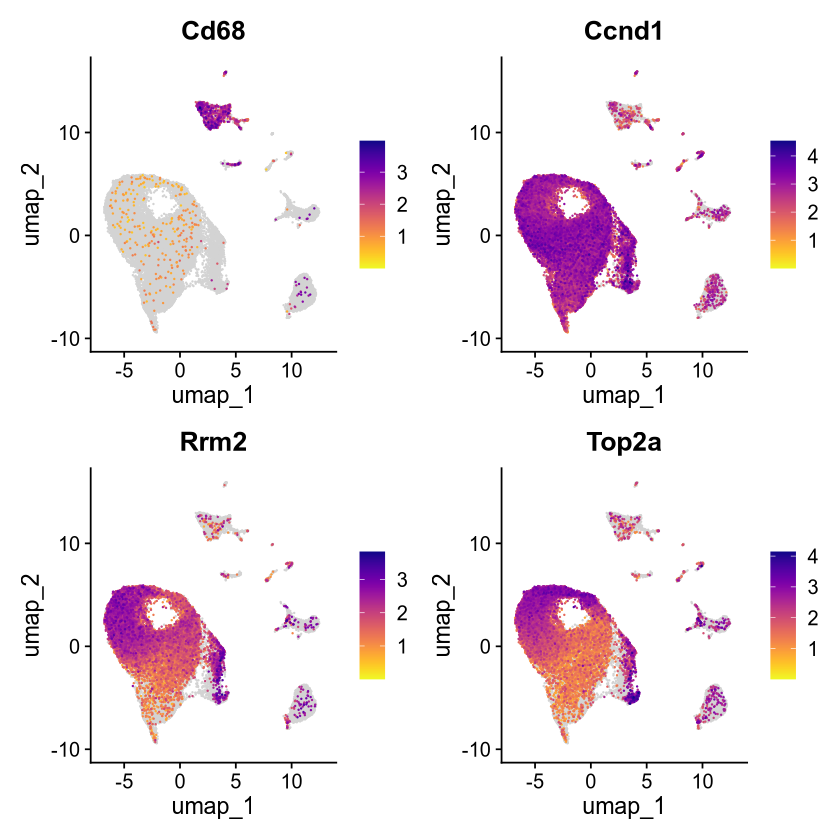

In [126]:
fig.size(7,7)
FeaturePlot_scCustom(immune.combined, features = c('Cd68','Ccnd1','Rrm2','Top2a'))

In [127]:
DefaultAssay(immune.combined) = "RNA"

In [128]:
genes_of_interest <- unique(annotations.df$Gene) %>% stringr::str_to_title()

gene_data <- FetchData(immune.combined, vars = genes_of_interest) %>%
  tibble::rownames_to_column('cell')

# Convert rownames to a column for joining in metadata
metadata <- immune.combined@meta.data %>%
  tibble::rownames_to_column('cell')

# Calculate the average expression of the genes of interest per cluster


In [129]:
gene_data %>% head

,cell,Cartpt,Hist1h1b,Tsix,Cdc20,Mcm3,Klc1,Npy,Cd79a,Aspm,Trbc2,Txnip,Fcer1g,Crabp1,Mgp
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,homo1_tumor_AAACCCAAGAGGATCC-1,0.00000,0.000000,0.0000000,1.050017,0.0000000,0.0000000,0.0000000,0,1.050017,3.065011,1.5508338,0,0,0
2,homo1_tumor_AAACCCAAGCATGATA-1,0.00000,0.000000,0.0000000,0.000000,0.0000000,0.9614587,0.9614587,0,0.000000,0.000000,0.9614587,0,0,0
3,homo1_tumor_AAACCCAAGTTCCGGC-1,0.00000,0.000000,0.0000000,0.000000,0.0000000,0.0000000,0.0000000,0,0.000000,0.000000,0.0000000,0,0,0
4,homo1_tumor_AAACCCACAGTCCGTG-1,1.37677,0.000000,0.0000000,1.694354,0.9086789,0.0000000,0.0000000,0,0.000000,0.000000,0.0000000,0,0,0
5,homo1_tumor_AAACCCACATCAGCAT-1,0.00000,2.044553,0.7518644,1.701799,1.1761599,0.0000000,0.7518644,0,0.000000,0.000000,0.0000000,0,0,0
6,homo1_tumor_AAACCCAGTTTCGATG-1,0.00000,0.000000,0.0000000,0.000000,0.0000000,0.0000000,0.0000000,0,0.000000,0.000000,0.0000000,0,0,0


In [130]:
cluster_avg_expr <- metadata %>%
  left_join(gene_data, by = 'cell') %>%
  group_by(seurat_clusters) %>%
  summarise(across(all_of(genes_of_interest), mean, na.rm = TRUE)) %>%
  rowwise() %>%
  mutate(avg_expr = mean(c_across(all_of(genes_of_interest)), na.rm = TRUE)) %>%
  arrange(desc(avg_expr)) %>%
  pull(seurat_clusters)

In [131]:
cluster_avg_expr %>% unfactor

[1] "16" "2"  "10" "8"  "13" "17" "5"  "12" "6"  "3"  "0"  "18" "14" "9"  "7" 
[16] "1"  "11" "15" "19" "4"

In [132]:
immune.combined@active.ident = factor(
    immune.combined@active.ident, 
    levels = unfactor(cluster_avg_expr)
)

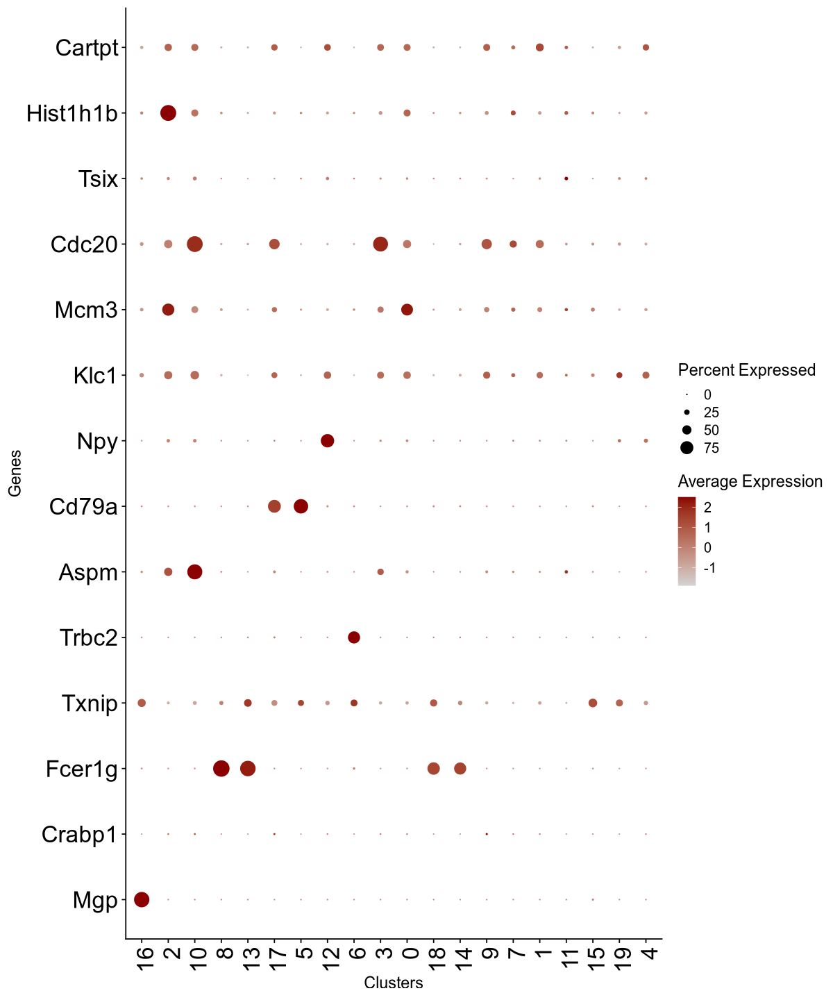

In [133]:
options(repr.plot.height=12, repr.plot.width=10, res=200)


# Create the DotPlot with reordered clusters
pdot <- DotPlot(
  immune.combined,
  assay = 'RNA',
  features = genes_of_interest %>% rev,
  cols = c("lightgrey", "darkred")
) +
  coord_flip() +
  theme(
    axis.text.x = element_text(size = 20, angle = 90, hjust = 1, vjust = 0.7),
    axis.text.y = element_text(size = 20)
  ) +
  xlab('Genes') +
  ylab('Clusters')

# Display the plot
print(pdot)

In [134]:
genes_of_interest <- unique(annotations.df$Gene) %>% str_to_title()

# Fetch the data for the genes of interest and add a cell column
gene_data <- FetchData(immune.combined, vars = genes_of_interest) %>%
  rownames_to_column('cell')

# Convert rownames to a column for joining in metadata
metadata <- immune.combined@meta.data %>%
  rownames_to_column('cell')

# Calculate the average expression of the genes of interest per cluster
avg_expr <- metadata %>%
  left_join(gene_data, by = 'cell') %>%
  group_by(seurat_clusters) %>%
  summarise(across(all_of(genes_of_interest), mean, na.rm = TRUE))

# Order clusters based on the average expression of the genes
cluster_order <- avg_expr %>%
  rowwise() %>%
  mutate(avg_expr_sum = sum(c_across(all_of(genes_of_interest)), na.rm = TRUE)) %>%
  arrange(desc(avg_expr_sum)) %>%
  pull(seurat_clusters) %>% unfactor

# Order genes based on their expression pattern across clusters
gene_order <- avg_expr %>%
  column_to_rownames('seurat_clusters') %>%
  summarise(across(everything(), sum, na.rm = TRUE)) %>%
  pivot_longer(cols = everything(), names_to = 'gene', values_to = 'total_expr') %>%
  arrange(desc(total_expr)) %>%
  pull(gene)

In [135]:
immune.combined@active.ident = factor(
    immune.combined@active.ident, 
    levels = cluster_order
)

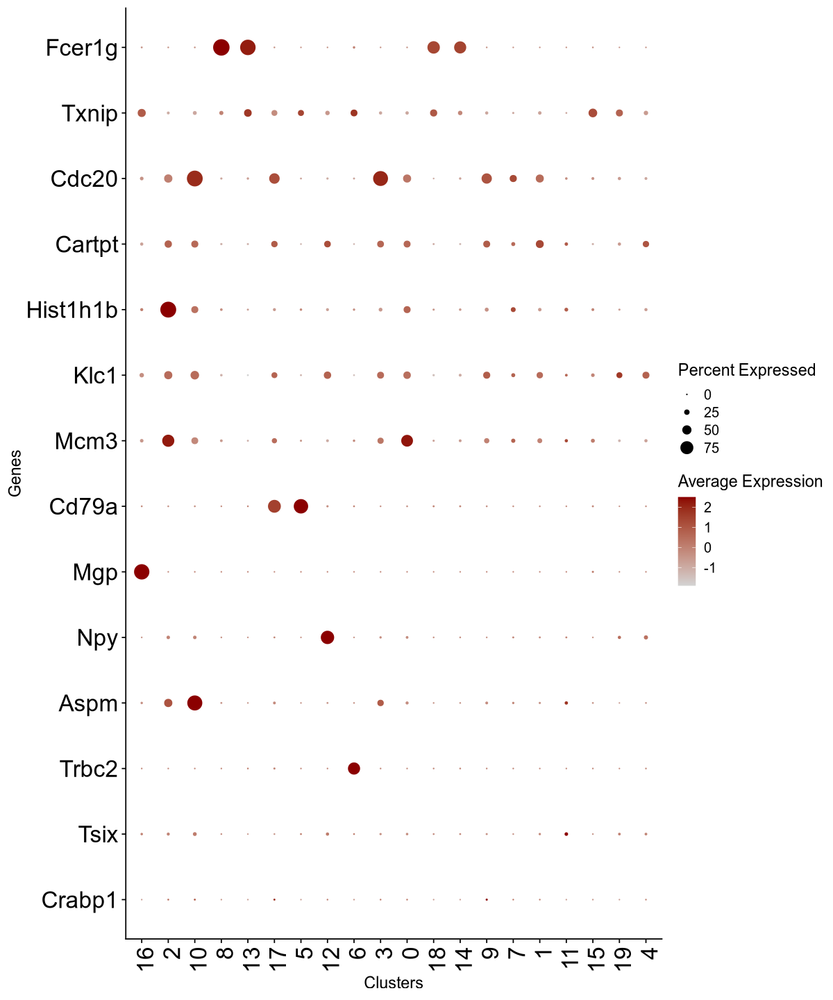

In [136]:
pdot <- DotPlot(
  immune.combined,
  assay = 'RNA',
  features = gene_order %>% rev,
  cols = c("lightgrey", "darkred")
) +
  coord_flip() +
  theme(
    axis.text.x = element_text(size = 20, angle = 90, hjust = 1, vjust = 0.7),
    axis.text.y = element_text(size = 20)
  ) +
  xlab('Genes') +
  ylab('Clusters')

# Display the plot
print(pdot)

In [137]:
DefaultAssay(immune.combined) = "RNA"
all_markers_RNA =  FindAllMarkers(
    immune.combined, 
    min.pct =  0.25, 
    min.diff.pct = 0.25
)

Calculating cluster 16

Calculating cluster 2

Calculating cluster 10

Calculating cluster 8

Calculating cluster 13

Calculating cluster 17

Calculating cluster 5

Calculating cluster 12

Calculating cluster 6

Calculating cluster 3

Calculating cluster 0

Calculating cluster 18

Calculating cluster 14

Calculating cluster 9

Calculating cluster 7

Calculating cluster 1

Calculating cluster 11

Calculating cluster 15

Calculating cluster 19

Calculating cluster 4



In [143]:
saveRDS(all_markers_RNA,'new_5_homo_samples_DE.rds')

In [144]:
up_down_20 = all_markers_RNA  %>% mutate(sign_up = sign(avg_log2FC)) %>% 
    group_by(cluster, sign_up) %>% slice_max(n = 10, order_by = abs(avg_log2FC)) 

In [145]:
plot_list = list()
i = 1
for(cluster_id in unique(up_down_20$cluster)){
     plot_list[[i]] = up_down_20 %>% filter(cluster == cluster_id) %>% 
        arrange(avg_log2FC) %>% ggplot(aes(x = reorder(gene,avg_log2FC),y=avg_log2FC)) +
        geom_bar(stat='identity') +
        coord_flip() +
        theme_classic() +
        theme(axis.text.y = element_text(size = 15),
              plot.title = element_text(hjust = 0.5)) + ggtitle(paste("Cluster",cluster_id))
    i = i + 1
}

In [146]:
library(gridExtra)

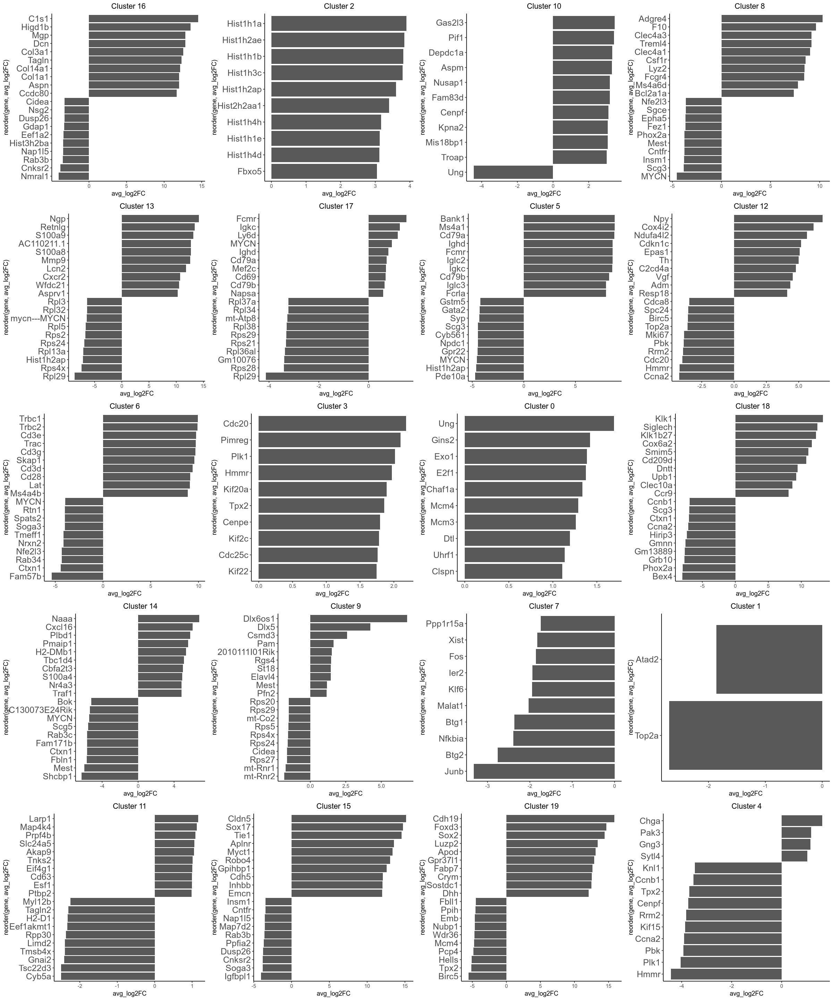

In [147]:
fig.size(24,20)
do.call("grid.arrange", c(plot_list, ncol = 4)) 

In [90]:
DefaultAssay(immune.combined) = "integrated"

In [95]:
immune.combined <- FindClusters(immune.combined, resolution = 0.2)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 41430
Number of edges: 1417005

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9320
Number of communities: 13
Elapsed time: 13 seconds


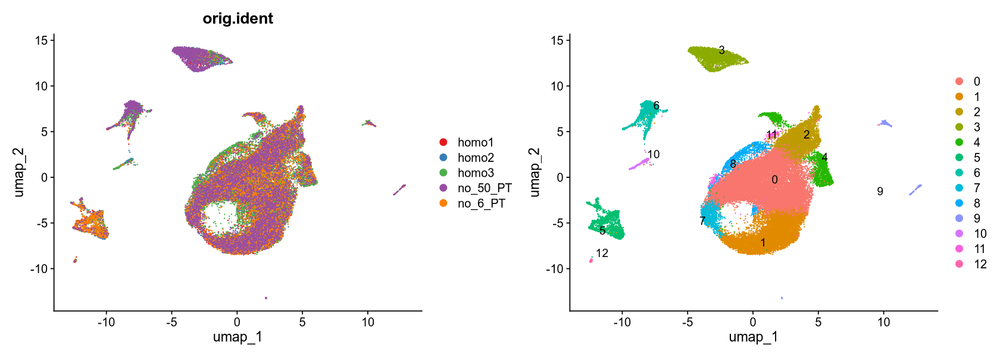

In [96]:
fig.size(5,14)

palette_name <- "Set1"
num_colors <- 5

# Check the available colors in the palette
colors <- brewer.pal(num_colors, palette_name)

# Plot with the selected palette
p1 = DimPlot(immune.combined, reduction = "umap", group.by = "orig.ident") +
  scale_color_manual(values = colors)

p2 <- DimPlot(immune.combined, reduction = "umap", label = TRUE,
    repel = TRUE)
p1 + p2

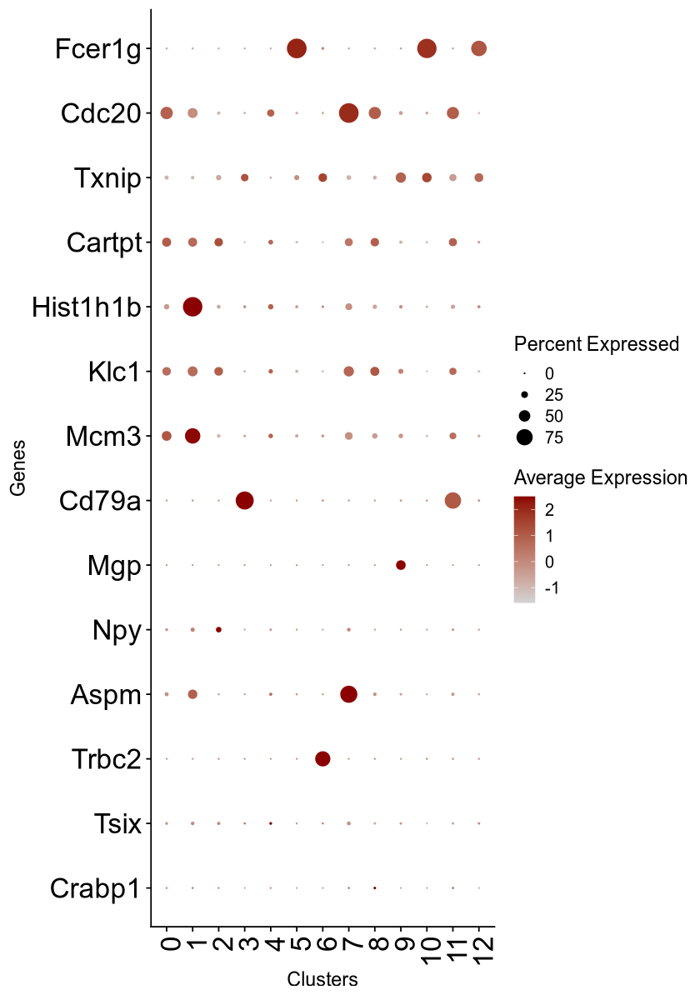

In [99]:
fig.size(10,7)
pdot <- DotPlot(
  immune.combined,
  assay = 'RNA',
  features = gene_order %>% rev,
  cols = c("lightgrey", "darkred")
) +
  coord_flip() +
  theme(
    axis.text.x = element_text(size = 20, angle = 90, hjust = 1, vjust = 0.7),
    axis.text.y = element_text(size = 20)
  ) +
  xlab('Genes') +
  ylab('Clusters')

# Display the plot
print(pdot)

In [100]:
adrn_sig = c('Sox11',
'Tcf4',
'Eml5',
'Ttc3',
'Meg3',
'Peg10',
'Atrx',
'Xist',
'Gm26917',
'Gm42418',
'Kcnq1ot1',
'Ptprs',
'Ncam1',
'Podxl2',
'Pcsk1n',
'Elavl3',
'MYCN'
)

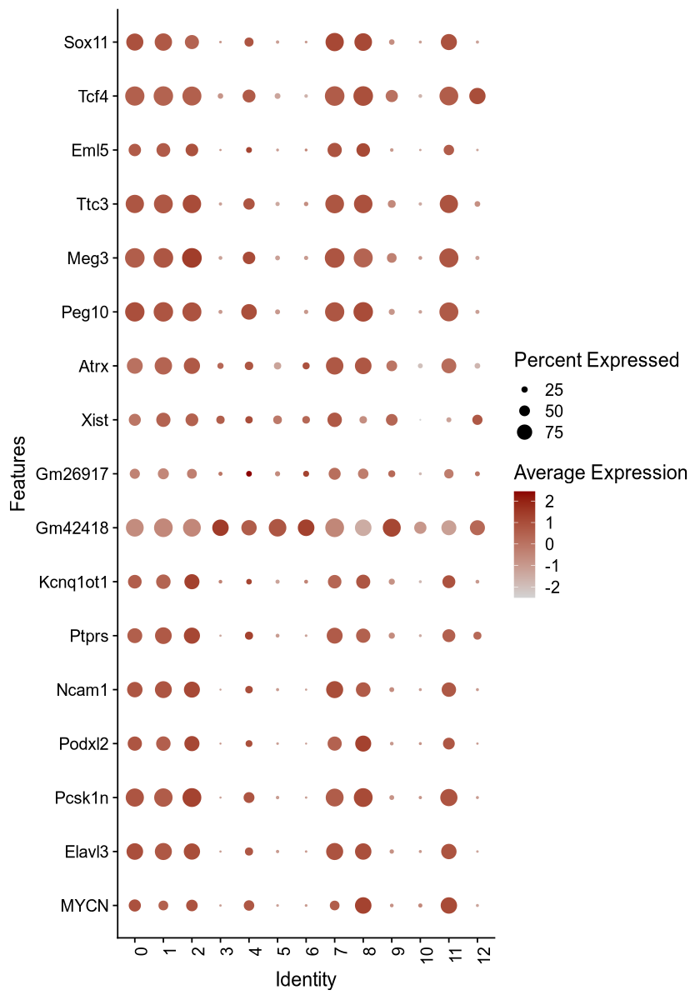

In [102]:
DotPlot(immune.combined, 
        assay='RNA',
        features = adrn_sig%>% rev, 
        #group.by='annot', 
        cols = c("lightgrey", "darkred"))+
         coord_flip()+theme(axis.text.x = element_text(angle = 90, hjust = 1))

In [103]:
gene_list <- c("Phox2b", "Nefl", "Cdc20", "Top2a", "Aspm", "Chga", "Th", "Ptprs", "Mgp", "Cdh5", 
               "Igkc", "Cd3d", "Fcer1g", "S100a9", "Syngr2", "Siglech")


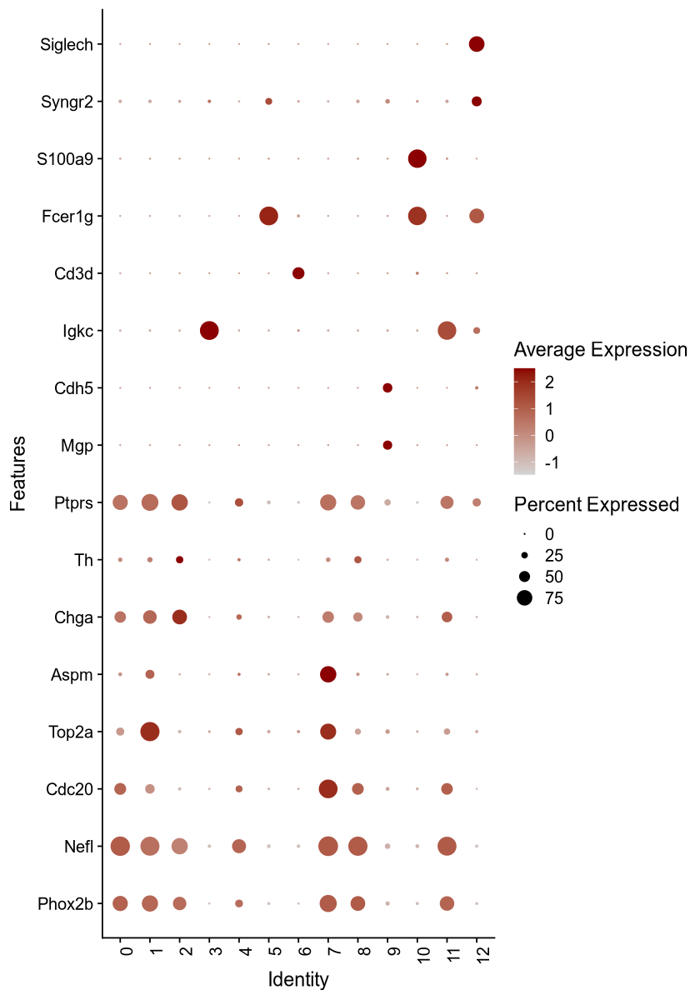

In [104]:
DotPlot(immune.combined, 
        assay='RNA',
        features = gene_list, 
        #group.by='annot', 
        cols = c("lightgrey", "darkred"))+
         coord_flip()+theme(axis.text.x = element_text(angle = 90, hjust = 1))

In [148]:
saveRDS(
    immune.combined,
    glue::glue(
            '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis',
            '/results/seurat_2/cancer_research_rebuttal/combined_new_5_samples.rds'
        )
)

In [106]:
DefaultAssay(immune.combined) = "RNA"
all_markers_RNA =  FindAllMarkers(
    immune.combined, 
    min.pct =  0.25, 
    min.diff.pct = 0.25
)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12



## Figure 1

In [13]:
annotations.df = openxlsx::read.xlsx(
    '20240627_Annotations_5-Homozygous_Samples.xlsx')

In [14]:
annotations.df

,Cluster.number,Annotations
,<dbl>,<chr>
1,0,Sympathoblasts
2,1,Sympathoblasts
3,2,S phase Sympathoblasts
4,3,M phase Sympathoblasts
5,4,Chromaffin-Sympathoblasts
6,5,B cells
7,6,T cells
8,7,Sympathoblasts
9,8,Myeloid cells


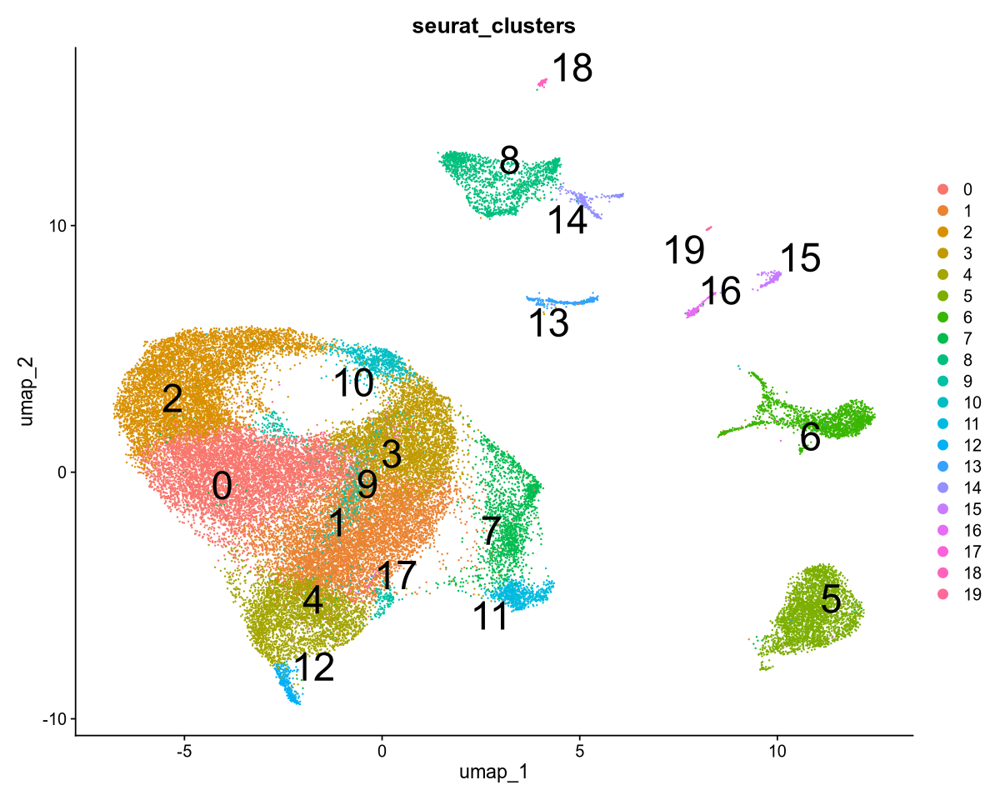

In [213]:
DimPlot(immune.combined, reduction = "umap", group.by='seurat_clusters',label = TRUE,label.size = 10,
    repel = TRUE)

In [15]:
immune.combined@meta.data$seurat_clusters %>% levels

[1] "0"  "1"  "2"  "3"  "4"  "5"  "6"  "7"  "8"  "9"  "10" "11" "12" "13" "14"
[16] "15" "16" "17" "18" "19"

In [16]:
annot = annotations.df$Annotation
immune.combined@meta.data$annot = annot[ immune.combined$seurat_clusters ]
Idents(immune.combined) = "annot"

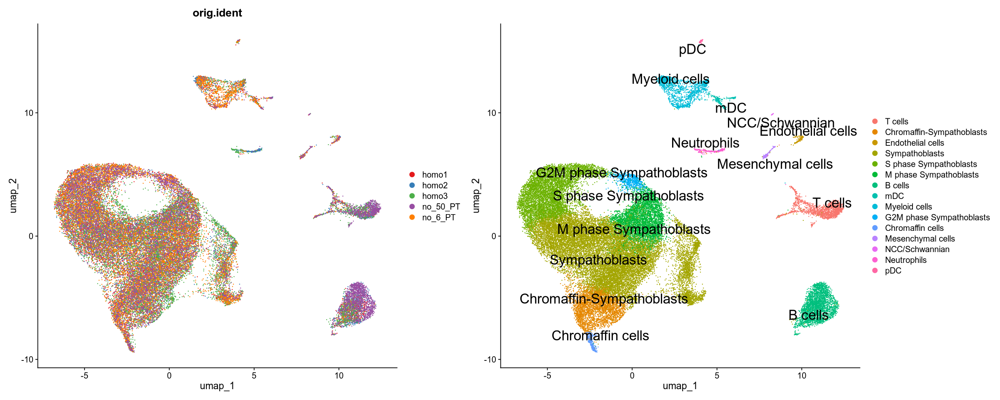

In [218]:
fig.size(8,20)

palette_name <- "Set1"
num_colors <- 5

# Check the available colors in the palette
colors <- brewer.pal(num_colors, palette_name)

# Plot with the selected palette
p1 = DimPlot(immune.combined, reduction = "umap", group.by = "orig.ident") +
  scale_color_manual(values = colors)

p2 <- DimPlot(immune.combined, reduction = "umap", label = TRUE, label.size = 7,
    repel = TRUE)
p1 + p2

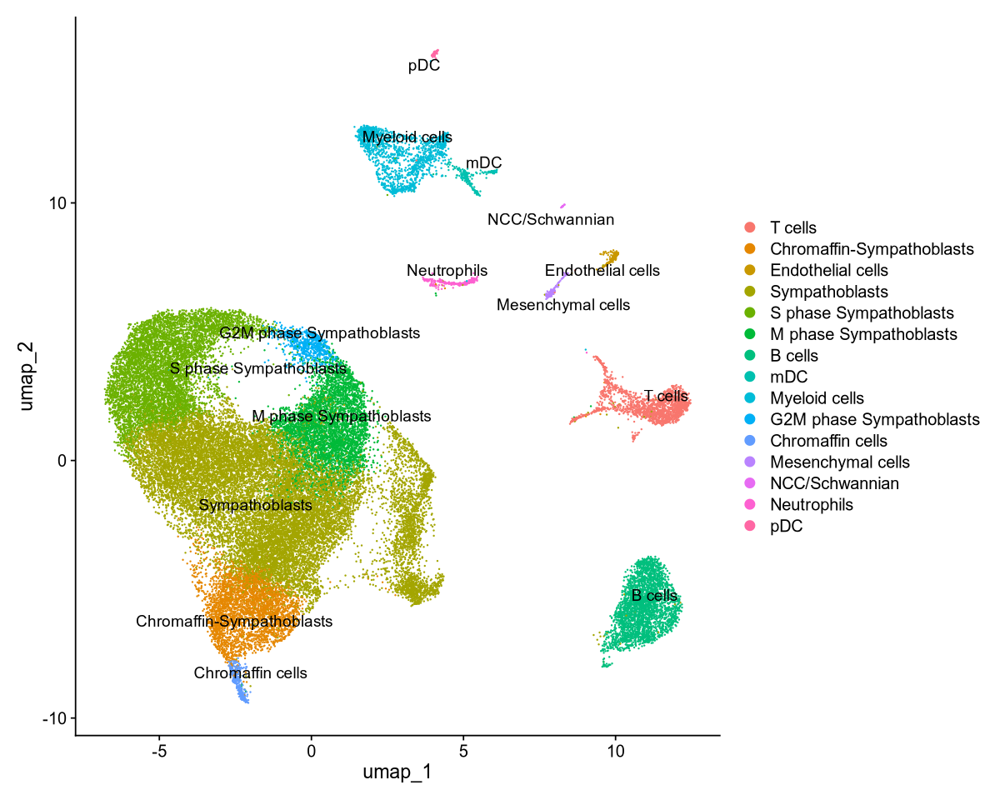

In [225]:
fig.size(8, 10)

p = DimPlot(immune.combined, reduction = "umap", label = TRUE,
    repel = TRUE)
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_1/20240627_Annotations_5-Homozygous_unlabeled.pdf'),
    plot =p, 
    height = 9,
    width = 15,
    create.dir=TRUE
      )
p

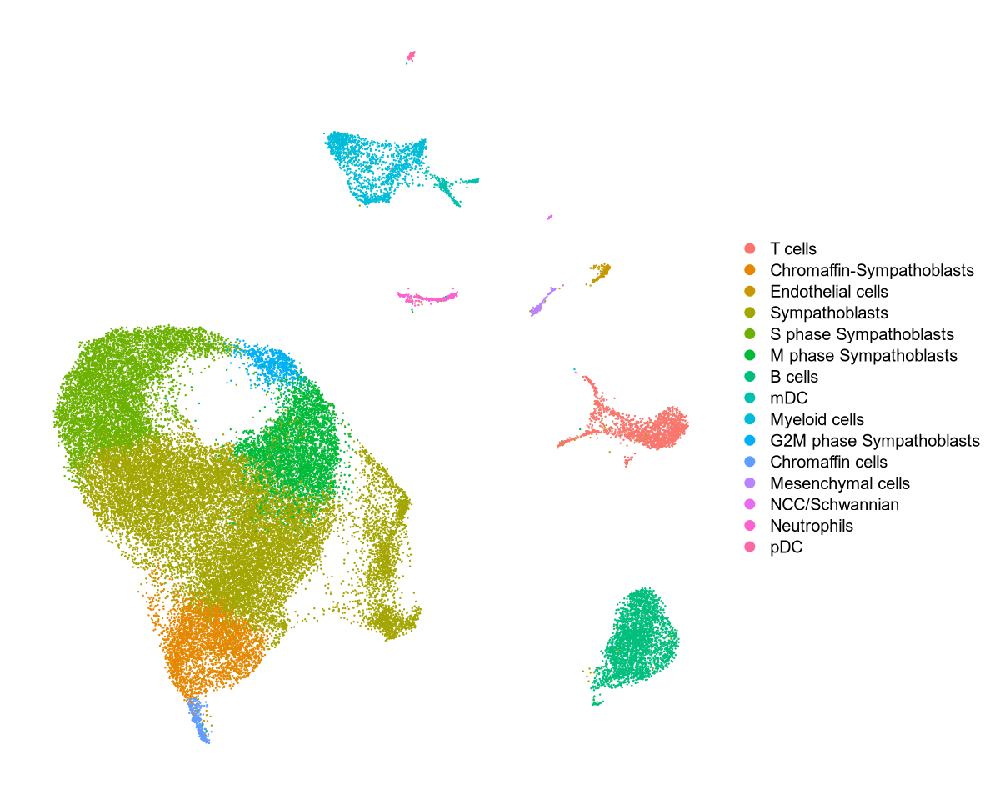

In [224]:
fig.size(8,10)
p = DimPlot(immune.combined, reduction = "umap") + NoAxes()
ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_1/20240627_Annotations_5-Homozygous_labeled.pdf'),
    plot =p, 
    height = 9,
    width = 15,
    create.dir=TRUE
      )
p

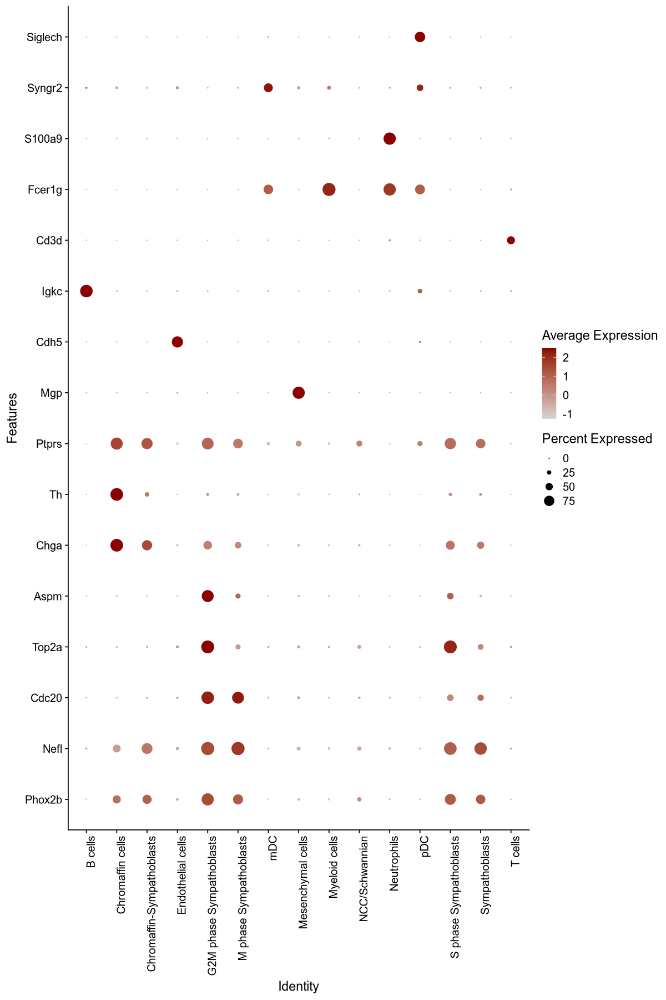

In [269]:
DotPlot(immune.combined, 
        assay='RNA',
        features = gene_list, 
        group.by='annot', 
        cols = c("lightgrey", "darkred"))+
         coord_flip()+theme(axis.text.x = element_text(angle = 90, hjust = 1))

In [270]:
signature.df = openxlsx::read.xlsx(
    '../spread_sheet/Figure5_20240214_No_6-50_Organoids_survival_signatures.xlsx'
)

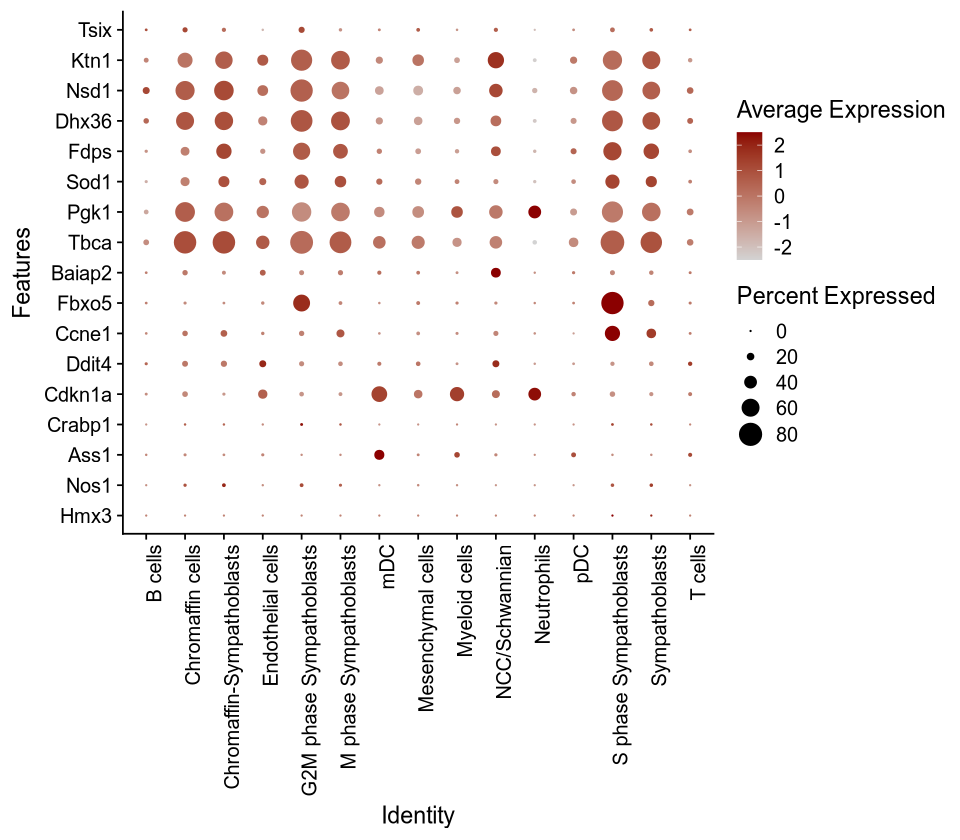

In [273]:
fig.size(7,8)
DotPlot(immune.combined, 
        assay='RNA',
        features = signature.df$Mouse.Gene %>% rev, 
        group.by='annot', 
        cols = c("lightgrey", "darkred"))+
         coord_flip()+theme(axis.text.x = element_text(angle = 90, hjust = 1))

In [277]:
sig_groups = signature.df %>% 
    group_by(Annotation) %>%
    summarize(ValueList = list(Mouse.Gene), .groups = 'drop')
sig_groups_list.mouse = sig_groups$ValueList
names(sig_groups_list.mouse) = sig_groups$Annotation

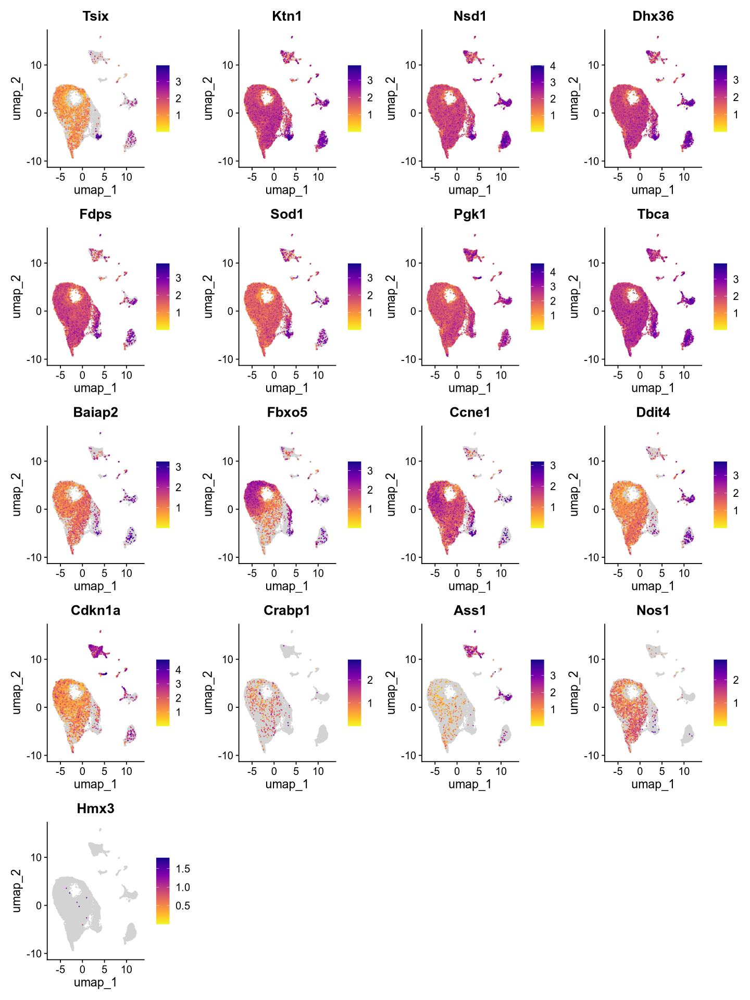

In [281]:
FeaturePlot_scCustom(
    immune.combined, 
    reduction = "umap", 
    features = signature.df$Mouse.Gene)

In [279]:
fig.size(16, 12)
plot.list = list()
for (label in sig_groups_list.mouse %>% names){
plot.list[[label]] = FeaturePlot_scCustom(
    immune.combined, 
    reduction = "umap", 
    features = sig_groups_list.mouse[[label]]) + ggtitle(label)

ggsave(
    plot = plot.list[[label]],
    filename = glue::glue(
        '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
        'results/figures/2024/Figure_1/Sig_',
        label,
        '.pdf'
    ),
    create.dir=T,
    width = 12,
    height = 16,
    dpi=300
)
plot.list[[label]] 
    }

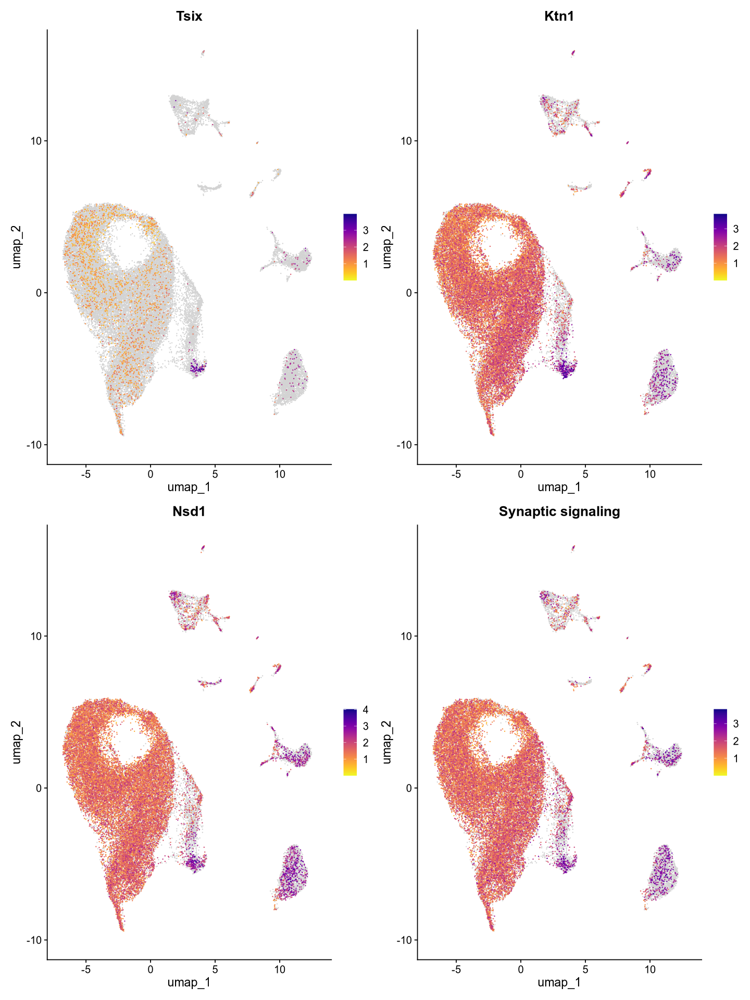

In [280]:
fig.size(16, 12)
plot.list[[label]]

In [ ]:
fig.size(7,8)
DotPlot(, 
        assay='RNA',
        features = signature.df$Mouse.Gene %>% rev, 
        group.by='annot', 
        cols = c("lightgrey", "darkred"))+
         coord_flip()+theme(axis.text.x = element_text(angle = 90, hjust = 1))

## MsigDB Analysis

In [168]:
suppressPackageStartupMessages({
    library(msigdbr)
    library(DOSE)
    #library(ReactomePA)
    library(clusterProfiler)
})

In [175]:
DefaultAssay(immune.combined) = "RNA"
all_markers_RNA =  FindAllMarkers(
    immune.combined, 
    min.pct =  0.25, 
    min.diff.pct = 0.25
)

Calculating cluster Mesenchymal cells

Calculating cluster mDC

Calculating cluster Sympathoblasts

Calculating cluster Chromaffin cells

Calculating cluster Neutrophils

Calculating cluster Endothelial cells

Calculating cluster T cells

Calculating cluster pDC

Calculating cluster S phase Sympathoblasts

Calculating cluster Chromaffin-Sympathoblasts

Calculating cluster Myeloid cells

Calculating cluster NCC/Schwannian

Calculating cluster M phase Sympathoblasts

Calculating cluster B cells

Calculating cluster G2M phase Sympathoblasts



In [176]:
saveRDS(all_markers_RNA,'new_5_homo_samples_annotated_DE.rds')

In [178]:
all_markers_RNA  %>% mutate(sign_up = sign(avg_log2FC)) %>% head

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene,sign_up
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<dbl>
Trbc1,0,9.927464,0.389,0.003,0,Mesenchymal cells,Trbc1,1
Trbc2,0,9.890966,0.695,0.006,0,Mesenchymal cells,Trbc2,1
Cd3e,0,9.768496,0.329,0.002,0,Mesenchymal cells,Cd3e,1
Trac,0,9.702105,0.467,0.004,0,Mesenchymal cells,Trac,1
Cd3g,0,9.689046,0.506,0.004,0,Mesenchymal cells,Cd3g,1
Skap1,0,9.573156,0.400,0.003,0,Mesenchymal cells,Skap1,1


In [179]:
de_ko_wt_up = all_markers_RNA %>% 
    filter(p_val_adj < 0.05) %>% 
    filter(avg_log2FC > 0.1)

In [180]:
species = "mouse"
pathway_collection = msigdbr::msigdbr_collections()
gene_name_list = de_ko_wt_up %>% dplyr::select(gene, cluster) %>% unstack
gene_name_list = lapply(gene_name_list, unique)

enrich_pathways_msigdb = lapply( unique(pathway_collection$gs_cat), function(gene_set){
    m_t2g <- msigdbr::msigdbr(species = species, category = gene_set) %>% 
          dplyr::select(gs_name, gene_symbol) %>% distinct()
    enrich_all <- compareCluster(gene_name_list, enricher, TERM2GENE=m_t2g, 
                             pvalueCutoff=0.05)
    
})

In [261]:
immune.gene.name = gene_name_list[c('mDC','Neutrophils','T cells','pDC','Myeloid cells','B cells')]

In [262]:
library(msigdbr)
#genesets = msigdbr(species = "mouse", category = "C2", subcategory = "CGP")
m_t2g <- msigdbr::msigdbr(species = species, category = "C5", subcategory = "GO:BP") %>% 
          dplyr::select(gs_name, gene_symbol) %>% distinct()
enrich_all_bp <- compareCluster(immune.gene.name, enricher, TERM2GENE=m_t2g, 
                             pvalueCutoff=0.05)

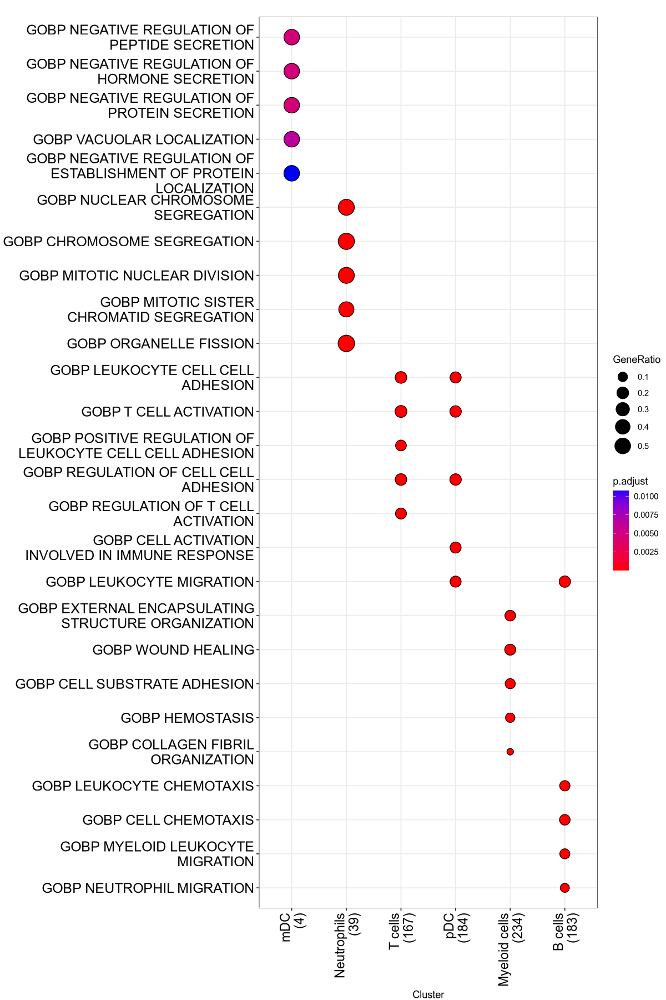

In [266]:
fig.size(15,10)
enrich_results_C2 = enrich_all_bp
enrich_df <- as.data.frame(enrich_all_bp)

# Function to get top 5 pathways per cluster
get_top_5_per_cluster <- function(df) {
  df %>% 
    group_by(Cluster) %>% 
    arrange(p.adjust) %>% 
    slice_head(n = 5)
}

# Apply the function to get top 5 pathways per cluster
top_5_per_cluster <- get_top_5_per_cluster(enrich_df)

# Create a new compareClusterResult object for the top pathways
top_ids <- top_5_per_cluster$ID
top_results <- enrich_results_C2[top_ids]

# Ensure the top_results is still a compareClusterResult object
top_compareClusterResult <- enrich_results_C2
top_compareClusterResult@compareClusterResult <- top_5_per_cluster

# Plot the top pathways using dotplot
dotplot(top_compareClusterResult) + 
  theme_bw() + 
  geom_point(shape=21, color="black") + 
  theme(legend.position = "right", 
        axis.text = element_text(color="black"), 
        axis.text.x = element_text(size=14, angle = 90, vjust = 0.5, hjust=1),
        axis.text.y = element_text(size=15),
        plot.margin = margin(0,0,0,0,'pt')) + 
  paletteer::scale_fill_paletteer_c("grDevices::Heat" , direction = -1)

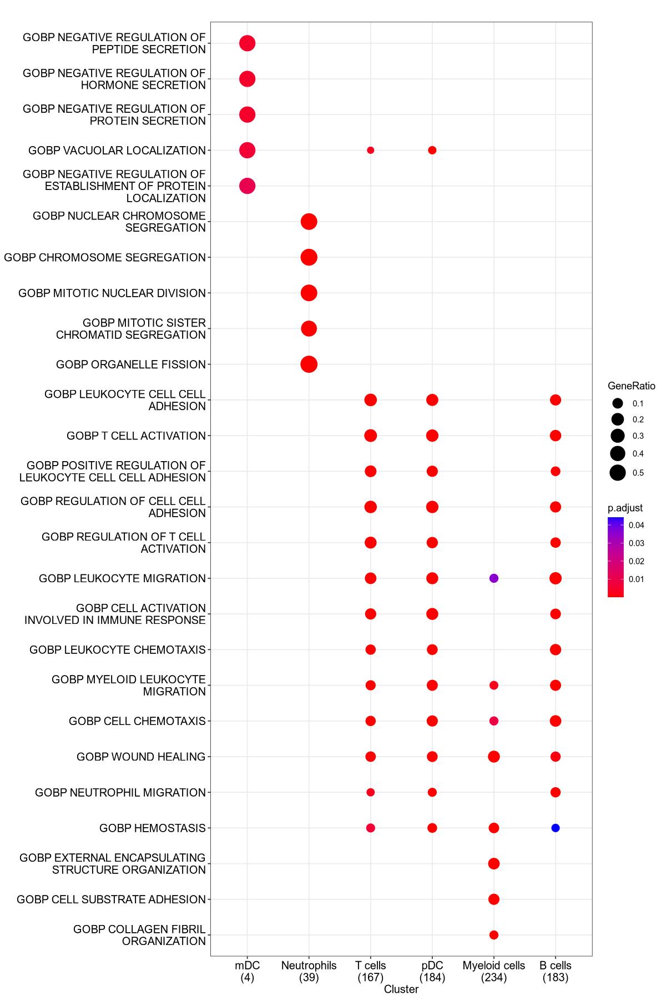

In [268]:
dotplot(enrich_all_bp)

In [181]:
names(enrich_pathways_msigdb) = unique(pathway_collection$gs_cat)

In [226]:
names(enrich_pathways_msigdb)

[1] "C1" "C2" "C3" "C4" "C5" "C6" "C7" "C8" "H"

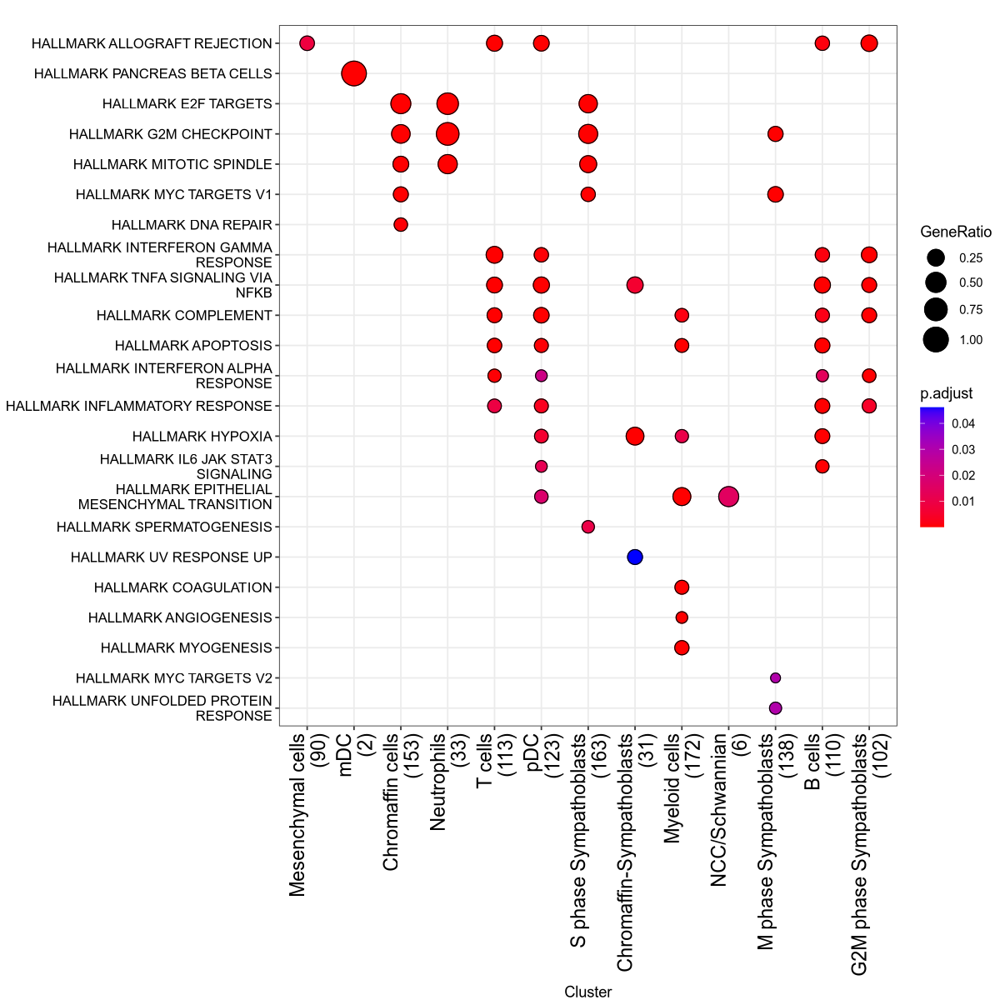

In [186]:
fig.size(10,10)
enrich_pathways_msigdb$H %>% dotplot +  theme_bw() + geom_point(shape=21, color="black") + theme(legend.position = "right", axis.text = element_text(color="black"), 
                                  axis.text.x = element_text(size=14, angle = 90, vjust = 0.5, hjust=1),
                                  axis.text.y = element_text(size=10),
                                  plot.margin = margin(0,0,0,0,'pt')) + paletteer::scale_fill_paletteer_c("grDevices::Heat" , direction = -1)

In [244]:
enrich_pathways_msigdb$C6@compareClusterResult %>% head

,Cluster,ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count
,<fct>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<int>
1,Mesenchymal cells,RB_P130_DN.V1_DN,RB_P130_DN.V1_DN,9/128,135/10254,4.616073e-05,0.006554824,0.006365322,B2m/Ubxn4/Gnai3/Selenok/Ddx46/Ddx3x/Glo1/Spop/Prpf38b,9
2,Sympathoblasts,CSR_LATE_UP.V1_UP,CSR_LATE_UP.V1_UP,3/6,159/10254,7.071074e-05,0.001484926,0.001116485,Mt1/Srm/Ube2c,3
3,Sympathoblasts,CAHOY_NEURONAL,CAHOY_NEURONAL,2/6,100/10254,1.376856e-03,0.014456983,0.010869912,Nefm/Nefl,2
4,Sympathoblasts,ATF2_UP.V1_UP,ATF2_UP.V1_UP,2/6,181/10254,4.436104e-03,0.021554735,0.016206568,Nefm/Nefl,2
5,Sympathoblasts,ATF2_S_UP.V1_UP,ATF2_S_UP.V1_UP,2/6,194/10254,5.080775e-03,0.021554735,0.016206568,Nefm/Nefl,2
6,Sympathoblasts,P53_DN.V1_DN,P53_DN.V1_DN,2/6,195/10254,5.132080e-03,0.021554735,0.016206568,Nefm/Nefl,2


In [232]:
names(enrich_pathways_msigdb)

[1] "C1" "C2" "C3" "C4" "C5" "C6" "C7" "C8" "H"

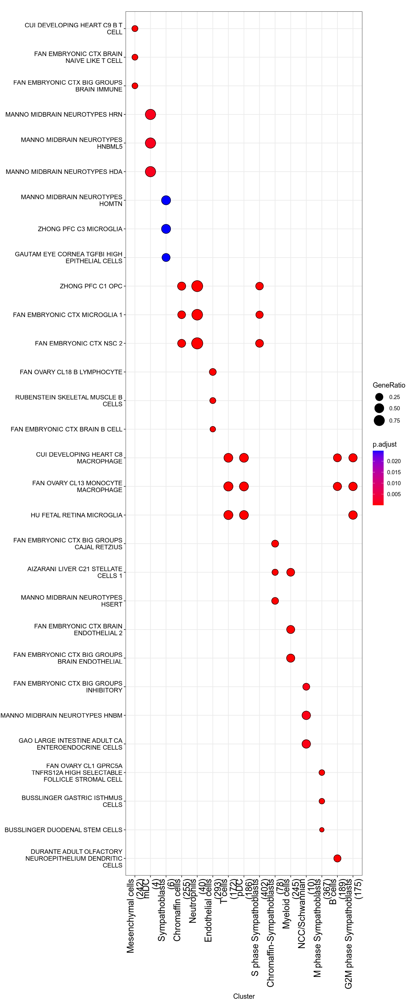

In [237]:
fig.size(22,9)

# Extract the enrichment results for the 'C2' category
# Extract the enrichment results for the 'C2' category
enrich_results_C2 <- enrich_pathways_msigdb$C8

# Convert the results to a data frame
enrich_df <- as.data.frame(enrich_results_C2)

# Function to get top 5 pathways per cluster
get_top_5_per_cluster <- function(df) {
  df %>% 
    group_by(Cluster) %>% 
    arrange(p.adjust) %>% 
    slice_head(n = 3)
}

# Apply the function to get top 5 pathways per cluster
top_5_per_cluster <- get_top_5_per_cluster(enrich_df)

# Create a new compareClusterResult object for the top pathways
top_ids <- top_5_per_cluster$ID
top_results <- enrich_results_C2[top_ids]

# Ensure the top_results is still a compareClusterResult object
top_compareClusterResult <- enrich_results_C2
top_compareClusterResult@compareClusterResult <- top_5_per_cluster

# Plot the top pathways using dotplot
dotplot(top_compareClusterResult) + 
  theme_bw() + 
  geom_point(shape=21, color="black") + 
  theme(legend.position = "right", 
        axis.text = element_text(color="black"), 
        axis.text.x = element_text(size=14, angle = 90, vjust = 0.5, hjust=1),
        axis.text.y = element_text(size=10),
        plot.margin = margin(0,0,0,0,'pt')) + 
  paletteer::scale_fill_paletteer_c("grDevices::Heat" , direction = -1)

In [4]:
immune.combined = readRDS(
    glue::glue(
            '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis',
            '/results/seurat_2/cancer_research_rebuttal/combined_new_5_samples.rds'
        )
)

## Cellcycle regression 

In [50]:
cc.genes.mm = readRDS('~/cc.genes.mm.rds')

In [51]:
s.genes = cc.genes.mm$s.genes
g2m.genes = cc.genes.mm$g2m.genes

In [52]:
combined <- CellCycleScoring(immune.combined, s.features = s.genes, g2m.features = g2m.genes, set.ident = TRUE)

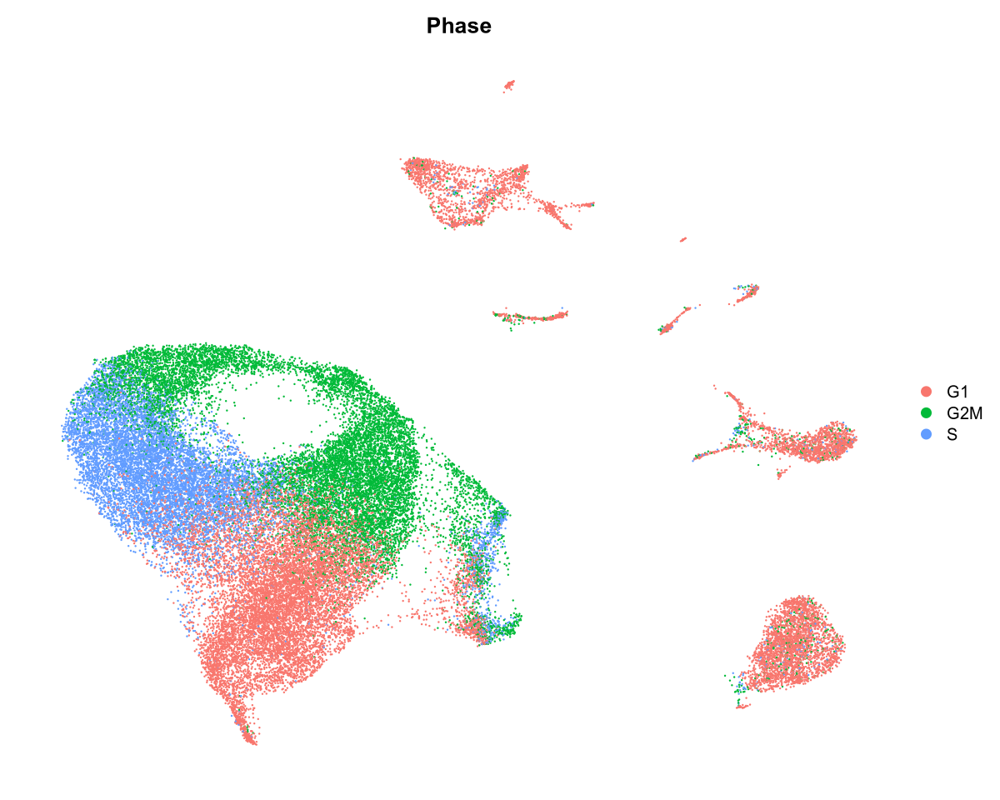

In [20]:
fig.size(8,10)
p1 = DimPlot(combined, group.by = "Phase") + NoAxes()
p1

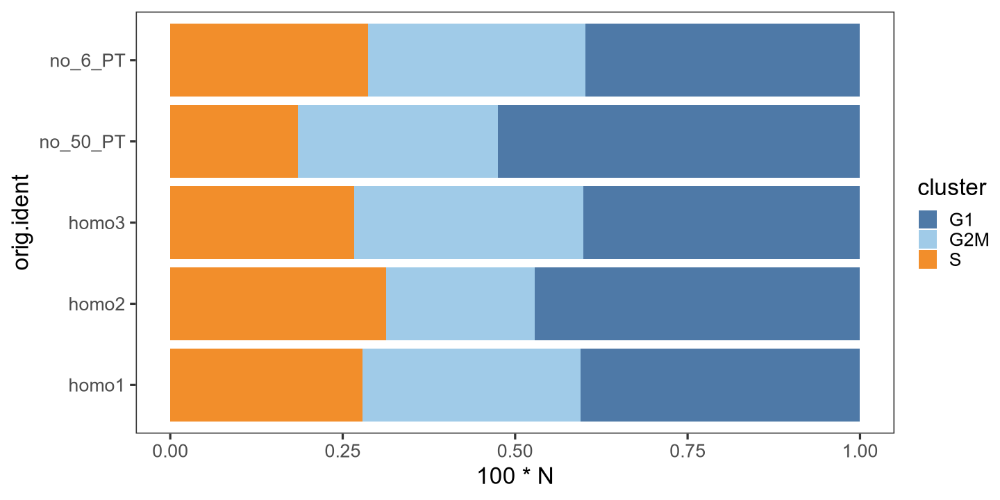

In [21]:
fig.size(6,12)
combined@meta.data %>%
    with(prop.table(table( orig.ident, Phase ), 1)) %>%
    data.table() %>%
    mutate(cluster = Phase) %>%
    ggplot(aes(orig.ident, 100*N, fill = cluster)) +
    geom_bar(stat = 'identity', position = position_fill()) +
    ggthemes::scale_fill_tableau('Tableau 20') +
    coord_flip() +
    theme_test(base_size = 20)

In [11]:
saveRDS(
    combined,
    glue::glue(
            '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis',
            '/results/seurat_2/cancer_research_rebuttal/combined_new_5_samples.rds'
        )
)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,integrated_snn_res.0.5,seurat_clusters,integrated_snn_res.0.3,annot,adrn_score1,UMAP_1,UMAP_2,annot.rename,S.Score,G2M.Score,Phase,old.ident
,<chr>,<dbl>,<int>,<dbl>,<fct>,<fct>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<fct>
homo1_tumor_AAACCCAAGAGGATCC-1,homo1,5383,2171,3.152207,6,6,15,T cells,-0.3471324,4.066091205,11.0850522,T cells,0.046717497,0.65484782,G2M,6
homo1_tumor_AAACCCAAGCATGATA-1,homo1,6190,2942,6.464957,4,4,18,Sympathoblasts 6,0.9163484,7.812572385,-0.9984247,Adrenergic,-0.399397957,-0.42505876,G1,4
homo1_tumor_AAACCCAAGTTCCGGC-1,homo1,2727,1611,2.731411,15,15,22,Endothelial,-0.2210504,1.648098554,-12.9656871,Endothelial,-0.199470189,-0.35236221,G1,15
homo1_tumor_AAACCCACAGTCCGTG-1,homo1,6752,2948,4.288632,1,1,5,Sympathoblasts 1,0.5585668,0.008969511,0.6955534,Adrenergic,-0.199929906,0.22074448,G2M,1
homo1_tumor_AAACCCACATCAGCAT-1,homo1,8921,3615,4.265615,2,2,9,Sympathoblasts 4,0.4782346,-4.005131338,-5.1730831,Adrenergic,0.510674583,0.47952247,S,2
homo1_tumor_AAACCCAGTTTCGATG-1,homo1,10225,3919,6.117974,1,1,13,Sympathoblasts 1,0.5820631,3.072592880,-0.5764552,Adrenergic,-0.284591819,-0.26287301,G1,1
homo1_tumor_AAACCCATCCCTGGTT-1,homo1,4738,2507,7.594300,0,0,1,Sympathoblasts 1,0.7727302,1.857501055,-2.1017037,Adrenergic,0.005117239,-0.17210994,S,0
homo1_tumor_AAACGAAAGGGAGGTG-1,homo1,6966,3128,3.491474,0,0,4,Sympathoblasts 1,0.2781055,-0.622904991,-2.6272297,Adrenergic,0.075046342,-0.04224451,S,0
homo1_tumor_AAACGAACAACGAGGT-1,homo1,8962,3496,4.518614,3,3,12,Sympathoblasts 3,0.6312022,-0.976537083,1.9754624,Adrenergic,-0.251052601,0.15598442,G2M,3


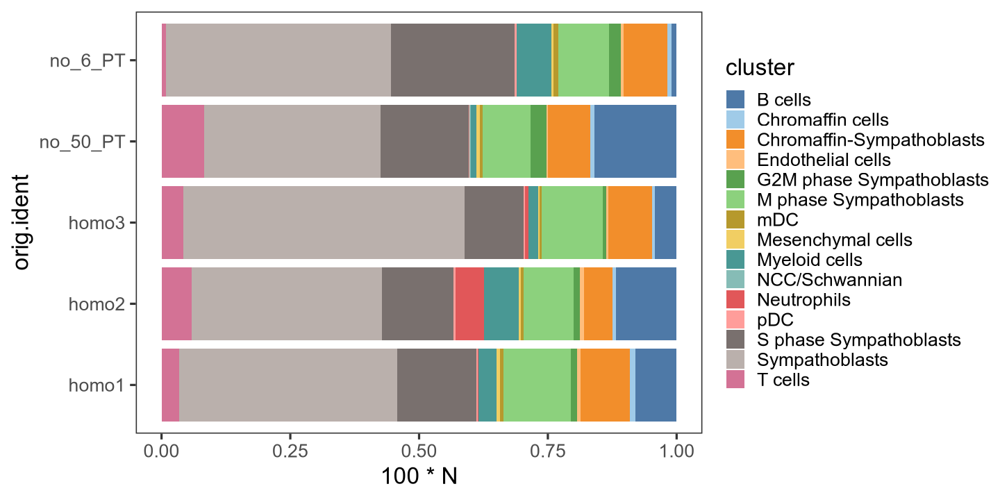

In [22]:
fig.size(6,12)
combined@meta.data %>%
    with(prop.table(table( orig.ident, annot ), 1)) %>%
    data.table() %>%
    mutate(cluster = annot) %>%
    ggplot(aes(orig.ident, 100*N, fill = cluster)) +
    geom_bar(stat = 'identity', position = position_fill()) +
    ggthemes::scale_fill_tableau('Tableau 20') +
    coord_flip() +
    theme_test(base_size = 20)

In [39]:
combined@meta.data$annot %>% unique %>% length

[1] 15

In [ ]:
ggthemes::scale_fill_tableau('Tableau 20')

In [41]:
color.list = ggthemes::tableau_color_pal('Tableau 20')(20)[1:15]

In [42]:
names(color.list) = combined@meta.data$annot %>% unique

In [43]:
color.list

T cells Chromaffin-Sympathoblasts         Endothelial cells 
                "#4E79A7"                 "#A0CBE8"                 "#F28E2B" 
           Sympathoblasts    S phase Sympathoblasts    M phase Sympathoblasts 
                "#FFBE7D"                 "#59A14F"                 "#8CD17D" 
                  B cells                       mDC             Myeloid cells 
                "#B6992D"                 "#F1CE63"                 "#499894" 
 G2M phase Sympathoblasts          Chromaffin cells         Mesenchymal cells 
                "#86BCB6"                 "#E15759"                 "#FF9D9A" 
           NCC/Schwannian               Neutrophils                       pDC 
                "#79706E"                 "#BAB0AC"                 "#D37295"

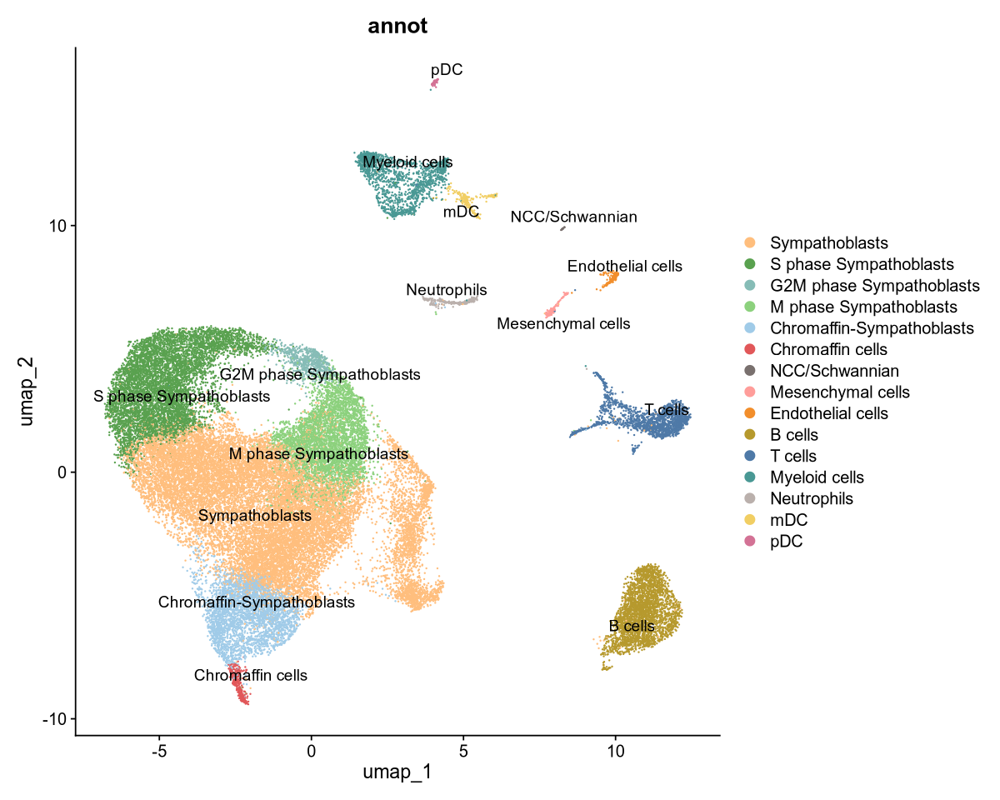

In [49]:
fig.size(8, 10)
DimPlot(combined, group.by = 'annot',
        reduction = "umap", label = TRUE,
    repel = TRUE) + 
    scale_color_manual(values = color.list)

In [46]:
saveRDS(color.list, 'new_5_sample_homo_list.rds')

In [24]:
write.csv(combined@meta.data, 'homo_annot.csv')

### Dotplot

In [30]:
dotplot.sig.df = openxlsx::read.xlsx(
    '20240805_Figure1C_Dotplot_5-Homozygous_Samples.xlsx',sheet = 'Dotplot'
)

In [31]:
dotplot.sig.df

,Gene,Annotation
,<chr>,<chr>
1,MYCN,Sympathoblasts
2,Stmn1,S phase Sympathoblasts
3,Isl1,G2M phase Sympathoblasts
4,Cdc20,M phase Sympathoblasts
5,Nefl,Chromaffin-Sympathoblasts
6,Phox2b,Chromaffin cells
7,Rrm2,NCC/Schwannian
8,Top2a,Mesenchymal cells
9,Cenpa,Endothelial cells


In [32]:
combined$annot = factor(
    combined$annot, levels=na.omit(dotplot.sig.df$Annotation)) 

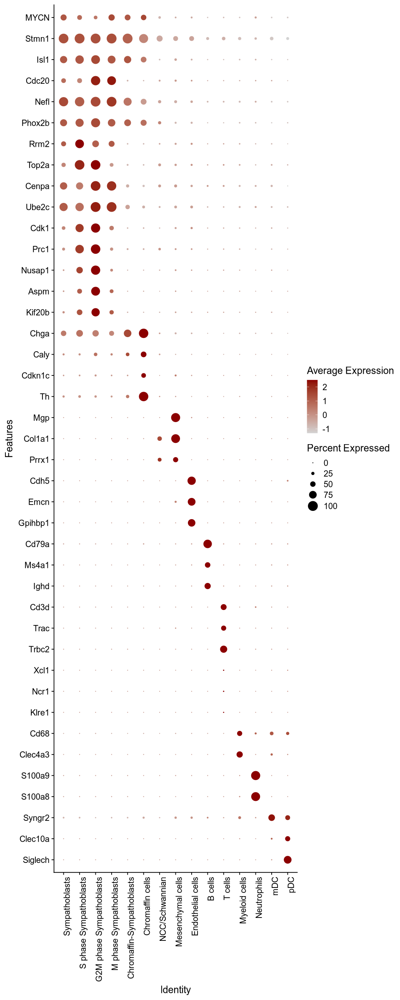

In [34]:
fig.size(20,8)
DotPlot(
        combined, 
        assay='RNA',
        features = dotplot.sig.df$Gene %>% rev, 
        group.by='annot', 
        cols = c("lightgrey", "darkred"))+
         coord_flip()+theme(axis.text.x = element_text(angle = 90, hjust = 1))

In [1]:
print('hello')

[1] "hello"


In [36]:
saveRDS(
    combined,
    glue::glue(
            '/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis',
            '/results/seurat_2/cancer_research_rebuttal/combined_new_5_homo.rds'
        )
)

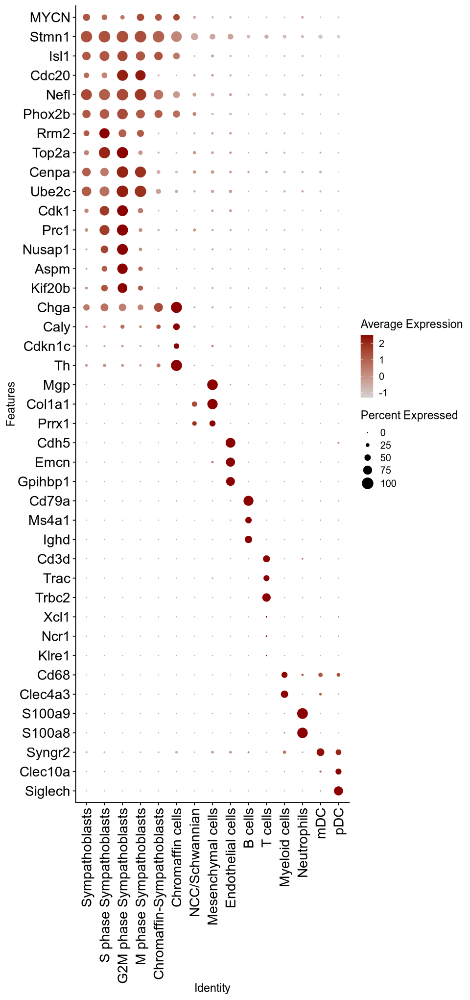

In [37]:
fig.size(17,8)
longdotplot = DotPlot(
    combined, 
        assay='RNA',
        features = dotplot.sig.df$Gene %>% rev, 
        group.by='annot', 
        cols = c("lightgrey", "darkred"))+
         coord_flip()+theme(
             axis.text.x = element_text(
                 angle = 90, hjust=1, vjust=0.5,
             size=17),
             axis.text.y = element_text(
             size=17)
         )
longdotplot

In [38]:

ggsave(
     glue::glue('/scratch/gpfs/KANG/hirak/mendel/Projects/neuroblastoma_analysis/',
    'results/figures/2024/Figure_1/20240805_Figure1C_Dotplot_5-Homozygous_Samples.pdf'),
    plot =longdotplot, 
    height = 17,
    width = 8,
    create.dir=TRUE
      )


In [ ]:
features <- SelectIntegrationFeatures(object.list = hemi.list)
hemi.list <- lapply(X = hemi.list, FUN = function(x) {
    x <- ScaleData(x, features = features, verbose = FALSE)
    x <- RunPCA(x, features = features, verbose = FALSE)
})

In [ ]:
immune.anchors <- FindIntegrationAnchors(
    object.list = hemi.list, 
    anchor.features = features, 
    reduction = "rpca"
)

In [ ]:
immune.combined <- IntegrateData(anchorset = immune.anchors)

In [ ]:
DefaultAssay(immune.combined) <- "integrated"

# Run the standard workflow for visualization and clustering
immune.combined <- ScaleData(immune.combined, verbose = FALSE)
immune.combined <- RunPCA(immune.combined, npcs = 30, verbose = FALSE)
immune.combined <- RunUMAP(immune.combined, reduction = "pca", dims = 1:30)
immune.combined <- FindNeighbors(immune.combined, reduction = "pca", dims = 1:30)
immune.combined <- FindClusters(immune.combined, resolution = 0.5)